
## MALL Extended Cleaning (5-Minute Base)



**Purpose:** This notebook constructs the 5-minute MALL extended feature set by using the new 5-minute intraday MHAR dataset as the starting point, appending the same macro-financial predictors used in the standard MALL notebook, and then adding three extra euro-area rate variables together with two spread variables constructed from them. The goal is to preserve the original feature logic while testing whether the expanded rate information adds explanatory power in the later 5-minute MALL model comparisons.


In [240]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from IPython.display import display

# Load 5-minute MHAR dataset
file_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Cleaned Data Sets/MHAR_5min_intraday.csv"
MHAR = pd.read_csv(file_path, index_col="Date", parse_dates=True)

print(f"Shape: {MHAR.shape}")
print(f"Index type: {type(MHAR.index)}")
print(f"Index dtype: {MHAR.index.dtype}")
print(f"Date range: {MHAR.index[0].strftime('%Y-%m-%d')} to {MHAR.index[-1].strftime('%Y-%m-%d')}")
print(f"NaN values: {MHAR.isna().sum().sum()}")
print("\nFirst few rows:")
MHAR.head()


Shape: (5674, 12)
Index type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
Index dtype: datetime64[ns]
Date range: 1998-03-30 to 2020-08-07
NaN values: 0

First few rows:


,RVD,RVW,RVM,logRVD,logRVW,logRVM,RVD_pos,RVD_neg,RD_neg,RW_neg,RM_neg,RQ
Date,,,,,,,,,,,,
1998-03-30,0.000071,0.000060,0.000064,-9.550019,-9.727785,-9.653726,0.000032,0.000039,-0.003233,0.0,0.0,7.017334e-09
1998-03-31,0.000053,0.000058,0.000064,-9.844566,-9.746576,-9.649957,0.000026,0.000027,0.000000,0.0,0.0,4.848406e-09
1998-04-01,0.000065,0.000063,0.000064,-9.638335,-9.676560,-9.652131,0.000043,0.000022,0.000000,0.0,0.0,4.904402e-09
1998-04-02,0.000045,0.000059,0.000064,-10.009022,-9.730652,-9.656873,0.000030,0.000015,0.000000,0.0,0.0,3.868715e-09
1998-04-03,0.000077,0.000062,0.000065,-9.473854,-9.684375,-9.637785,0.000050,0.000027,0.000000,0.0,0.0,8.732961e-09



### 1. Adding Variables to Create the 5-Minute MALL Extended Dataset
We begin from the 5-minute intraday MHAR feature set and then merge each external variable using a left join so that the EURO STOXX 50 trading calendar remains the reference calendar throughout the construction process. After replicating the standard MALL predictors, we append three additional euro-area rate variables and two spread variables derived from them.


In [242]:

# Use the 5-minute MHAR feature set as the base dataframe
MALL = MHAR.copy()


#### 1.1 VSTOXX Index

In [246]:

# Load VSTOXX data
vstoxx_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/VSTOXX.csv"
VSTOXX = pd.read_csv(vstoxx_path)

# Drop Symbol column as it is constant and uninformative
VSTOXX = VSTOXX.drop(columns=["Symbol"])

# Convert Date to DatetimeIndex
VSTOXX["Date"] = pd.to_datetime(VSTOXX["Date"])
VSTOXX = VSTOXX.set_index("Date")

# Rename column to uppercase for consistency
VSTOXX = VSTOXX.rename(columns={"vstoxx": "VSTOXX"})

# Merge with the 5-minute base dataset and forward fill non-trading gaps
MALL = MALL.join(VSTOXX, how="left")
MALL["VSTOXX"] = MALL["VSTOXX"].ffill()

# Log transform for log-based extensions
MALL["logVSTOXX"] = np.log(MALL["VSTOXX"])



#### 1.2 EPU Index
Economic policy uncertainty is included in both level and log form. We also retain the one-month lagged version to reflect slower-moving macro-financial uncertainty, in line with the original MALL construction.


In [249]:

# Load EPU data
epu_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/EPU.xlsx"
EPU = pd.read_excel(epu_path)

# Drop the last row which is a source citation
EPU = EPU.dropna(subset=["Month"])

# Keep only European News Index
EPU = EPU[["Year", "Month", "European_News_Index"]].copy()
EPU["Year"] = EPU["Year"].astype(int)
EPU["Month"] = EPU["Month"].astype(int)

# Construct month-start timestamps
EPU["Date"] = pd.to_datetime(
    EPU["Year"].astype(str) + "-" + EPU["Month"].astype(str) + "-01"
)
EPU = EPU.set_index("Date")
EPU = EPU.drop(columns=["Year", "Month"])
EPU = EPU.rename(columns={"European_News_Index": "EPU"})

# Merge and fill monthly values across trading days
MALL = MALL.join(EPU, how="left")
MALL["EPU"] = MALL["EPU"].ffill()
MALL["logEPU"] = np.log(MALL["EPU"])

# One-month lagged EPU aligned to month starts
MALL["EPU_1m_lag"] = (
    MALL["EPU"]
    .resample("MS")
    .first()
    .shift(1)
    .reindex(MALL.index, method="ffill")
)
MALL["logEPU_1m_lag"] = np.log(MALL["EPU_1m_lag"])



### 1.3 EUR/USD Exchange Rate
**Source:** ECB Data Portal.
We include the EUR/USD level and its daily log return to capture exchange-rate conditions relevant for European financial markets.


In [252]:

# Load EUR/USD exchange rate data from ECB
eurusd_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/ECB Data Portal long_20260311191107.xlsx"
EURUSD = pd.read_excel(eurusd_path, sheet_name="DATA(EXR)")

# Keep only DATE and OBS.VALUE columns
EURUSD = EURUSD[["DATE", "OBS.VALUE"]].copy()
EURUSD["DATE"] = pd.to_datetime(EURUSD["DATE"])
EURUSD = EURUSD.set_index("DATE")
EURUSD = EURUSD.rename(columns={"OBS.VALUE": "EURUSD"})

# Forward fill weekends and holidays before merging
EURUSD["EURUSD"] = EURUSD["EURUSD"].ffill()
MALL = MALL.join(EURUSD, how="left")
MALL["EURUSD_ret"] = np.log(MALL["EURUSD"] / MALL["EURUSD"].shift(1))



### 1.4 CISS
**Source:** ECB.
The Composite Indicator of Systemic Stress is included as a broad European stress proxy that complements implied-volatility and realized-volatility measures.


In [254]:

# Load CISS data
ciss_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/CISS.csv"
CISS = pd.read_csv(ciss_path)

# Rename the long ECB series label
CISS = CISS.rename(columns={
    "NEW CISS - Composite Indicator of Systemic Stress. (CISS.D.U2.Z0Z.4F.EC.SS_CIN.IDX)": "CISS"
})

CISS = CISS.drop(columns=["TIME PERIOD"])
CISS["DATE"] = pd.to_datetime(CISS["DATE"])
CISS = CISS.set_index("DATE")

MALL = MALL.join(CISS, how="left")



### 1.5 Europe Brent Crude Oil Spot Price
**Source:** U.S. Energy Information Administration (EIA).
Brent is added in both level and return form to capture commodity-market conditions that may spill over into European equity volatility.


In [256]:

# Load Brent crude oil price data, skipping metadata rows
brent_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/Europe_Brent_Spot_Price_FOB.csv"
BRENT = pd.read_csv(brent_path, skiprows=4)
BRENT.columns = ["Date", "BRENT"]
BRENT["Date"] = pd.to_datetime(BRENT["Date"])
BRENT = BRENT.set_index("Date")
BRENT = BRENT.sort_index()

MALL = MALL.join(BRENT, how="left")
MALL["BRENT"] = MALL["BRENT"].ffill()
MALL["BRENT_ret"] = np.log(MALL["BRENT"] / MALL["BRENT"].shift(1))



### 1.6 Global Spillovers: NIKKEI 225 and S&P 500
**Sources:** FRED for NIKKEI 225 and Wall Street Journal Markets for the S&P 500.
Following the original notebook, we include Asian and U.S. spillover proxies. Nikkei information is predetermined relative to the European trading day, while the S&P 500 variables are lagged by one day to avoid look-ahead bias.


#### 1.6.1 NIKKEI 225

In [262]:

# Load Nikkei 225 data
nikkei_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/NIKKEI225.csv"
NIKKEI = pd.read_csv(nikkei_path)

NIKKEI["observation_date"] = pd.to_datetime(NIKKEI["observation_date"])
NIKKEI = NIKKEI.set_index("observation_date")
NIKKEI.index.name = "Date"

# Forward fill Japanese holidays and compute return measures
NIKKEI["NIKKEI225"] = NIKKEI["NIKKEI225"].ffill()
NIKKEI["NIKKEI_ret"] = np.log(NIKKEI["NIKKEI225"] / NIKKEI["NIKKEI225"].shift(1))
NIKKEI["NIKKEI_sq"] = NIKKEI["NIKKEI_ret"].pow(2)

MALL = MALL.join(NIKKEI[["NIKKEI_ret", "NIKKEI_sq"]], how="left")


#### 1.6.2 S&P 500

In [265]:

# Load S&P 500 data
sp500_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/M-ALL Feature Set/S&P500.csv"
SP500 = pd.read_csv(sp500_path)
SP500.columns = SP500.columns.str.strip()
SP500 = SP500[["Date", "Close"]].copy()
SP500["Date"] = pd.to_datetime(SP500["Date"], format="%m/%d/%y")
SP500 = SP500.set_index("Date")
SP500 = SP500.sort_index()

# Compute returns, then lag them by one day for European-market forecasting
SP500["SP500_ret"] = np.log(SP500["Close"] / SP500["Close"].shift(1))
SP500["SP500_ret_lag"] = SP500["SP500_ret"].shift(1)
SP500["SP500_sq_lag"] = SP500["SP500_ret_lag"].pow(2)

MALL = MALL.join(SP500[["SP500_ret_lag", "SP500_sq_lag"]], how="left")
MALL["SP500_ret_lag"] = MALL["SP500_ret_lag"].ffill()
MALL["SP500_sq_lag"] = MALL["SP500_sq_lag"].ffill()



### 1.7 Momentum Measures (M1W and M1M)
Momentum is constructed from daily close prices as 5-day and 22-day cumulative log-price changes, matching the original MALL specification.


In [268]:

# Load daily close prices
close_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/Cleaned Data Sets/daily_close.csv"
close = pd.read_csv(close_path, index_col="Date", parse_dates=True)

close["log_close"] = np.log(close["Close"])
close["M1W"] = close["log_close"].diff(5)
close["M1M"] = close["log_close"].diff(22)

MALL = MALL.join(close[["M1W", "M1M"]], how="left")


### 1.8 3-Month Euribor
We add the 3-month Euribor level as a short-term euro-area funding-rate measure and align it to the EURO STOXX 50 trading calendar via a forward-filled daily join. We also retain its signed daily change in the companion variable `EURIBOR_3M_diff`.


In [271]:
# Load 3-month Euribor data
euribor_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Python Code/Constructing MALL Extended Feature Set/Extended Data/Euribor_3m.xlsx"
EURIBOR_3M = pd.read_excel(euribor_path)
EURIBOR_3M = EURIBOR_3M[["Timestamp", "CLOSE"]].copy()
EURIBOR_3M["Timestamp"] = pd.to_datetime(EURIBOR_3M["Timestamp"])
EURIBOR_3M = EURIBOR_3M.rename(columns={"Timestamp": "Date", "CLOSE": "EURIBOR_3M"})
EURIBOR_3M = EURIBOR_3M.set_index("Date")
EURIBOR_3M = EURIBOR_3M.sort_index()

MALL = MALL.join(EURIBOR_3M, how="left")
MALL["EURIBOR_3M"] = MALL["EURIBOR_3M"].ffill()
MALL["EURIBOR_3M_diff"] = MALL["EURIBOR_3M"].diff()


### 1.9 Euro 10-Year Swap Rate
The euro 10-year swap rate is added in level form to capture longer-horizon euro-area interest-rate conditions that may contain information about the volatility environment. We also retain its signed daily change in the companion variable `EURO_10Y_SWAP_diff`.


In [273]:
# Load euro 10-year swap rate data
swap_10y_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Python Code/Constructing MALL Extended Feature Set/Extended Data/Euro_10y_swap.xlsx"
EURO_10Y_SWAP = pd.read_excel(swap_10y_path)
EURO_10Y_SWAP = EURO_10Y_SWAP[["Timestamp", "CLOSE"]].copy()
EURO_10Y_SWAP["Timestamp"] = pd.to_datetime(EURO_10Y_SWAP["Timestamp"])
EURO_10Y_SWAP = EURO_10Y_SWAP.rename(columns={"Timestamp": "Date", "CLOSE": "EURO_10Y_SWAP"})
EURO_10Y_SWAP = EURO_10Y_SWAP.set_index("Date")
EURO_10Y_SWAP = EURO_10Y_SWAP.sort_index()

MALL = MALL.join(EURO_10Y_SWAP, how="left")
MALL["EURO_10Y_SWAP"] = MALL["EURO_10Y_SWAP"].ffill()
MALL["EURO_10Y_SWAP_diff"] = MALL["EURO_10Y_SWAP"].diff()


### 1.10 Euro 3-Month Overnight Index
This series adds a second short-rate measure based on the euro 3-month overnight index, again retained in level form and aligned to the trading-day calendar through a forward-filled join. We also retain its signed daily change in the companion variable `EURO_3M_OVERNIGHT_INDEX_diff`.


In [275]:
# Load euro 3-month overnight index data
overnight_3m_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Python Code/Constructing MALL Extended Feature Set/Extended Data/Euro_3m_overnight_index.xlsx"
EURO_3M_OVERNIGHT_INDEX = pd.read_excel(overnight_3m_path)
EURO_3M_OVERNIGHT_INDEX = EURO_3M_OVERNIGHT_INDEX[["Timestamp", "CLOSE"]].copy()
EURO_3M_OVERNIGHT_INDEX["Timestamp"] = pd.to_datetime(EURO_3M_OVERNIGHT_INDEX["Timestamp"])
EURO_3M_OVERNIGHT_INDEX = EURO_3M_OVERNIGHT_INDEX.rename(columns={"Timestamp": "Date", "CLOSE": "EURO_3M_OVERNIGHT_INDEX"})
EURO_3M_OVERNIGHT_INDEX = EURO_3M_OVERNIGHT_INDEX.set_index("Date")
EURO_3M_OVERNIGHT_INDEX = EURO_3M_OVERNIGHT_INDEX.sort_index()

MALL = MALL.join(EURO_3M_OVERNIGHT_INDEX, how="left")
MALL["EURO_3M_OVERNIGHT_INDEX"] = MALL["EURO_3M_OVERNIGHT_INDEX"].ffill()
MALL["EURO_3M_OVERNIGHT_INDEX_diff"] = MALL["EURO_3M_OVERNIGHT_INDEX"].diff()



### 1.11 EURIBOR_OIS_CS
We construct the Euribor-OIS spread as the difference between the 3-month Euribor rate and the euro 3-month overnight index. This spread captures short-term funding stress and interbank risk conditions in the euro area.


In [277]:

# Construct the Euribor-OIS spread
MALL["EURIBOR_OIS_CS"] = MALL["EURIBOR_3M"] - MALL["EURO_3M_OVERNIGHT_INDEX"]



### 1.12 TERM_CS
We construct the term spread as the difference between the euro 10-year swap rate and the 3-month Euribor rate. This measures the slope of the euro-area term structure in a simple and transparent way.


In [279]:

# Construct the euro-area term spread
MALL["TERM_CS"] = MALL["EURO_10Y_SWAP"] - MALL["EURIBOR_3M"]


### 1.13 Inspection of the Extended MALL Data Frame
Before constructing the target variables, we print the full data frame and run a short diagnostic check on the eight added rate, change, and spread variables so their alignment can be inspected directly.


In [286]:
# Print the full dataframe before creating target variables
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    display(MALL)

# Short diagnostics for the added rate, change, and spread variables
added_feature_cols = [
    "EURIBOR_3M",
    "EURIBOR_3M_diff",
    "EURO_10Y_SWAP",
    "EURO_10Y_SWAP_diff",
    "EURO_3M_OVERNIGHT_INDEX",
    "EURO_3M_OVERNIGHT_INDEX_diff",
    "EURIBOR_OIS_CS",
    "TERM_CS",
]

diagnostics = pd.DataFrame({
    "NaN_count": MALL[added_feature_cols].isna().sum(),
    "Non_NaN_count": MALL[added_feature_cols].notna().sum(),
    "First_valid_date": [MALL[col].first_valid_index() for col in added_feature_cols],
    "Last_valid_date": [MALL[col].last_valid_index() for col in added_feature_cols],
    "Min": MALL[added_feature_cols].min(),
    "Max": MALL[added_feature_cols].max(),
})

display(diagnostics)


,RVD,RVW,RVM,logRVD,logRVW,logRVM,RVD_pos,RVD_neg,RD_neg,RW_neg,RM_neg,RQ,VSTOXX,logVSTOXX,EPU,logEPU,EPU_1m_lag,logEPU_1m_lag,EURUSD,EURUSD_ret,CISS,BRENT,BRENT_ret,NIKKEI_ret,NIKKEI_sq,SP500_ret_lag,SP500_sq_lag,M1W,M1M,EURIBOR_3M,EURIBOR_3M_diff,EURO_10Y_SWAP,EURO_10Y_SWAP_diff,EURO_3M_OVERNIGHT_INDEX,EURO_3M_OVERNIGHT_INDEX_diff,EURIBOR_OIS_CS,TERM_CS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1998-03-30,7.119988e-05,0.000060,0.000064,-9.550019,-9.727785,-9.653726,3.172357e-05,3.947631e-05,-0.003233,0.000000,0.000000,7.017334e-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0027,14.35,NaN,-0.028862,8.330041e-04,NaN,NaN,0.016482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-03-31,5.303462e-05,0.000058,0.000064,-9.844566,-9.746576,-9.649957,2.595544e-05,2.707919e-05,0.000000,0.000000,0.000000,4.848406e-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0030,13.87,-0.034022,0.016111,2.595529e-04,NaN,NaN,0.013410,0.092587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-01,6.518151e-05,0.000063,0.000064,-9.638335,-9.676560,-9.652131,4.269558e-05,2.248593e-05,0.000000,0.000000,0.000000,4.904402e-09,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0029,13.72,-0.010874,-0.017426,3.036706e-04,NaN,NaN,0.017165,0.104717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-02,4.499217e-05,0.000059,0.000064,-10.009022,-9.730652,-9.656873,3.017312e-05,1.481905e-05,0.000000,0.000000,0.000000,3.868715e-09,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0030,13.38,-0.025094,-0.033734,1.137992e-03,NaN,NaN,0.016229,0.098150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-03,7.683470e-05,0.000062,0.000065,-9.473854,-9.684375,-9.637785,4.969177e-05,2.714293e-05,0.000000,0.000000,0.000000,8.732961e-09,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0052,13.63,0.018512,-0.011859,1.406346e-04,NaN,NaN,0.036314,0.116122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-06,5.681908e-05,0.000059,0.000064,-9.775638,-9.731681,-9.652821,4.537439e-05,1.144469e-05,0.000000,0.000000,0.000000,8.273194e-09,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0039,13.13,-0.037374,0.012056,1.453400e-04,NaN,NaN,0.064130,0.150822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-07,9.511700e-05,0.000068,0.000064,-9.260403,-9.599112,-9.650648,3.123300e-05,6.388400e-05,-0.015842,0.000000,0.000000,1.659058e-08,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0034,12.82,-0.023893,0.017216,2.963793e-04,NaN,NaN,0.041995,0.138262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-08,1.101722e-04,0.000077,0.000064,-9.113466,-9.474475,-9.662220,3.691136e-05,7.326080e-05,-0.011986,0.000000,0.000000,4.736170e-08,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0048,12.79,-0.002343,0.024597,6.050061e-04,NaN,NaN,0.017094,0.104379,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998-04-09,1.474820e-04,0.000097,0.000067,-8.821804,-9.237866,-9.612559,7.118732e-05,7.629471e-05,0.000000,0.000000,0.000000,1.103658e-07,NaN,NaN,86.597282,4.461268,NaN,NaN,NaN,NaN,0.0066,13.23,0.033823,0.009725,9.457614e-05,NaN,NaN,0.010171,0.096955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,NaN_count,Non_NaN_count,First_valid_date,Last_valid_date,Min,Max
EURIBOR_3M,183,5491,1999-01-04,2020-08-07,-0.489,5.393
EURIBOR_3M_diff,184,5490,1999-01-05,2020-08-07,-0.358,0.386
EURO_10Y_SWAP,183,5491,1999-01-04,2020-08-07,-0.350,6.004
EURO_10Y_SWAP_diff,184,5490,1999-01-05,2020-08-07,-0.485,0.500
EURO_3M_OVERNIGHT_INDEX,183,5491,1999-01-04,2020-08-07,-0.614,5.050
EURO_3M_OVERNIGHT_INDEX_diff,184,5490,1999-01-05,2020-08-07,-0.415,0.370
EURIBOR_OIS_CS,183,5491,1999-01-04,2020-08-07,-0.309,1.978
TERM_CS,183,5491,1999-01-04,2020-08-07,-0.997,2.900



### 1.14 Target Variables
As in the original MALL construction, we create next-day realized variance and its log transform so the resulting dataset can support both level and log specifications in later modeling notebooks.


In [288]:

# Construct next-day targets from the 5-minute realized variance base
MALL["RV_target"] = MALL["RVD"].shift(-1)
MALL["logRV_target"] = np.log(MALL["RV_target"])



### Final Status of the 5-Minute MALL Extended Feature Set
We finish by dropping rows with missing values induced by lags, joins, and the target construction, and then verify the final sample.


In [290]:

# Final cleanup after all feature engineering steps
MALL = MALL.dropna()

print(f"Final MALL_extended_5min shape: {MALL.shape}")
print(f"Date range: {MALL.index[0].strftime('%Y-%m-%d')} to {MALL.index[-1].strftime('%Y-%m-%d')}")
print(f"NaN values: {MALL.isna().sum().sum()}")


Final MALL_extended_5min shape: (5489, 39)
Date range: 1999-01-05 to 2020-08-06
NaN values: 0


In [291]:
# Prepare transformed variables for a thesis-style summary table
MALL_display = pd.DataFrame({
    "RVD":                      np.sqrt(MALL["RVD"] * 252) * 100,
    "RVW":                      np.sqrt(MALL["RVW"] * 252) * 100,
    "RVM":                      np.sqrt(MALL["RVM"] * 252) * 100,
    "logRVD":                   MALL["logRVD"],
    "logRVW":                   MALL["logRVW"],
    "logRVM":                   MALL["logRVM"],
    "RVD_pos":                  np.sqrt(MALL["RVD_pos"] * 252) * 100,
    "RVD_neg":                  np.sqrt(MALL["RVD_neg"] * 252) * 100,
    "RD_neg":                   MALL["RD_neg"] * 100,
    "RW_neg":                   MALL["RW_neg"] * 100,
    "RM_neg":                   MALL["RM_neg"] * 100,
    "RQ":                       MALL["RQ"] * 1e6,
    "VSTOXX":                   MALL["VSTOXX"],
    "logVSTOXX":                MALL["logVSTOXX"],
    "EPU":                      MALL["EPU"],
    "logEPU":                   MALL["logEPU"],
    "EPU_1m_lag":               MALL["EPU_1m_lag"],
    "logEPU_1m_lag":            MALL["logEPU_1m_lag"],
    "EURUSD":                   MALL["EURUSD"],
    "EURUSD_ret":               MALL["EURUSD_ret"] * 100,
    "CISS":                     MALL["CISS"],
    "BRENT":                    MALL["BRENT"],
    "BRENT_ret":                MALL["BRENT_ret"] * 100,
    "NIKKEI_ret":               MALL["NIKKEI_ret"] * 100,
    "NIKKEI_sq":                MALL["NIKKEI_sq"] * 1e4,
    "SP500_ret_lag":            MALL["SP500_ret_lag"] * 100,
    "SP500_sq_lag":             MALL["SP500_sq_lag"] * 1e4,
    "M1W":                      MALL["M1W"] * 100,
    "M1M":                      MALL["M1M"] * 100,
    "EURIBOR_3M":               MALL["EURIBOR_3M"],
    "EURIBOR_3M_diff":          MALL["EURIBOR_3M_diff"],
    "EURO_10Y_SWAP":            MALL["EURO_10Y_SWAP"],
    "EURO_10Y_SWAP_diff":       MALL["EURO_10Y_SWAP_diff"],
    "EURO_3M_OVERNIGHT_INDEX":  MALL["EURO_3M_OVERNIGHT_INDEX"],
    "EURO_3M_OVERNIGHT_INDEX_diff": MALL["EURO_3M_OVERNIGHT_INDEX_diff"],
    "EURIBOR_OIS_CS":           MALL["EURIBOR_OIS_CS"],
    "TERM_CS":                  MALL["TERM_CS"],
})

summary = pd.DataFrame({
    "Obs.":       MALL_display.count(),
    "Mean":       MALL_display.mean(),
    "Median":     MALL_display.median(),
    "Std. Dev.":  MALL_display.std(),
    "Skewness":   MALL_display.skew(),
    "Exc. Kurt.": MALL_display.kurt(),
    "Min":        MALL_display.min(),
    "Max":        MALL_display.max(),
}).round(4)

styled_summary = (
    summary.style
    .set_caption(
        "Table: Summary Statistics of the 5-Minute MALL Extended Feature Set -- EURO STOXX 50 "
        f"({MALL.index[0].strftime('%Y-%m-%d')} to {MALL.index[-1].strftime('%Y-%m-%d')}). "
        "RVD, RVW, RVM, RVD$_{pos}$, and RVD$_{neg}$ are shown as annualized std (%). "
        "RD$_{neg}$, RW$_{neg}$, RM$_{neg}$, EURUSD$_{ret}$, BRENT$_{ret}$, NIKKEI$_{ret}$, "
        "SP500$_{ret}$, M1W, and M1M are shown as %. RQ is scaled by $10^{6}$, while "
        "NIKKEI$_{sq}$ and SP500$_{sq}$ are scaled by $10^{4}$. The three added euro-area rate "
        "variables, their signed daily changes, and the two constructed spread variables are shown in their original units."
    )
    .format(lambda x: f"{x:,.4f}")
    .format(lambda x: f"{int(x):,}", subset=pd.IndexSlice[:, "Obs."])
    .set_table_styles([
        {"selector": "caption", "props": [("font-size", "12px"), ("font-weight", "bold"), ("text-align", "left"), ("padding-bottom", "8px"), ("color", "black"), ("caption-side", "top")]},
        {"selector": "thead tr th", "props": [("background-color", "white"), ("color", "black"), ("font-size", "11px"), ("text-align", "center"), ("padding", "6px 10px"), ("border-top", "2px solid black"), ("border-bottom", "1px solid black"), ("font-weight", "bold")]},
        {"selector": "tbody tr th", "props": [("font-size", "11px"), ("font-weight", "bold"), ("text-align", "left"), ("padding", "4px 10px"), ("color", "black"), ("background-color", "white"), ("border-right", "1px solid black")]},
        {"selector": "tbody tr td", "props": [("font-size", "11px"), ("text-align", "right"), ("padding", "4px 10px"), ("background-color", "white"), ("color", "black")]},
        {"selector": "tbody tr:last-child td, tbody tr:last-child th", "props": [("border-bottom", "2px solid black")]},
        {"selector": "table", "props": [("border-collapse", "collapse"), ("width", "100%"), ("border-top", "2px solid black"), ("border-bottom", "2px solid black")]},
        {"selector": "td, th", "props": [("border-left", "none"), ("border-right", "none")]},
    ])
)

display(styled_summary)


,Obs.,Mean,Median,Std. Dev.,Skewness,Exc. Kurt.,Min,Max
RVD,"5,489",16.1414,13.7566,9.9643,3.1650,20.3327,0.1529,157.1090
RVW,"5,489",16.5150,14.1776,9.3312,2.6206,11.0371,4.5161,93.5771
RVM,"5,489",16.8309,14.3951,8.7506,2.1512,6.4573,5.2907,71.7791
logRVD,"5,489",-9.4541,-9.4967,1.0296,0.0626,2.4799,-18.4959,-4.6259
logRVW,"5,489",-9.3634,-9.4364,0.9205,0.5761,0.4582,-11.7245,-5.6622
logRVM,"5,489",-9.2986,-9.4060,0.8661,0.6371,0.2909,-11.4079,-6.1926
RVD_pos,"5,489",11.2161,9.5365,6.7926,2.7655,13.5103,0.0892,83.3340
RVD_neg,"5,489",11.3704,9.4981,7.6556,3.8000,32.9415,0.1242,138.6355
RD_neg,"5,489",-0.4359,0.0000,0.8010,-3.3677,18.2738,-10.5367,0.0000
RW_neg,"5,489",-0.2054,0.0000,0.3810,-3.8290,25.4417,-5.4144,0.0000



### Graphs
To keep the presentation aligned with the original notebook, we include a realized-volatility time-series plot, a yearly box plot, and a small macro panel overview built from the completed 5-minute MALL dataset.


#### Realized Variance Time-Series

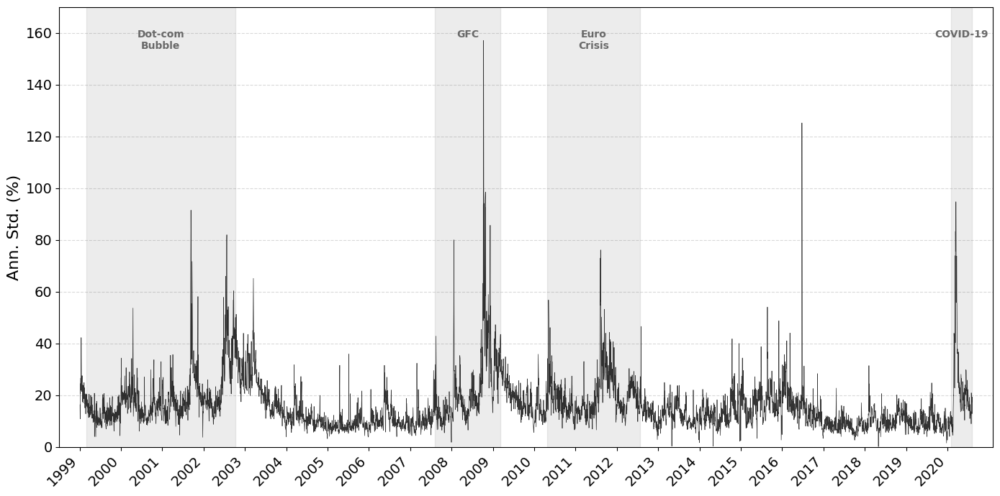

In [294]:

# Optional figure export directory for the 5-minute project
figure_dir = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Figures/Data"
os.makedirs(figure_dir, exist_ok=True)

fig, ax = plt.subplots(figsize=(14, 7))
rv_ann = np.sqrt(MALL["RVD"] * 252) * 100

ax.plot(MALL.index, rv_ann, color="black", linewidth=0.5, alpha=0.8)
ax.set_ylabel("Ann. Std. (%)", fontsize=16)
ax.set_ylim(0, 170)

start_data = MALL.index.min()
end_data = MALL.index.max()
padding = pd.DateOffset(months=6)
ax.set_xlim(start_data - padding, end_data + padding)
ax.xaxis.set_major_locator(mdates.YearLocator(1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

valid_ticks = [
    t for t in ax.get_xticks()
    if mdates.date2num(pd.Timestamp(f"{start_data.year}-01-01")) <= t
    <= mdates.date2num(pd.Timestamp(f"{end_data.year}-12-31"))
]
ax.set_xticks(valid_ticks)
plt.xticks(rotation=45, ha="right", fontsize=14)
plt.yticks(fontsize=14)

crisis_periods = [
    ("1999-03-01", "2002-10-09", "Dot-com\nBubble"),
    ("2007-08-09", "2009-03-09", "GFC"),
    ("2010-04-27", "2012-07-26", "Euro\nCrisis"),
    ("2020-02-01", "2020-08-07", "COVID-19"),
]

for start, end, label in crisis_periods:
    ax.axvspan(pd.Timestamp(start), pd.Timestamp(end), alpha=0.15, color="gray")
    mid = pd.Timestamp(start) + (pd.Timestamp(end) - pd.Timestamp(start)) / 2
    ax.text(mid, ax.get_ylim()[1] * 0.95, label, fontsize=10, ha="center", va="top", color="dimgray", fontweight="bold")

ax.grid(True, linestyle="--", alpha=0.3, color="gray", axis="y")
ax.set_axisbelow(True)
ax.set_facecolor("white")

plt.tight_layout()
plt.savefig(os.path.join(figure_dir, "RV_time_series_5min.pdf"), format="pdf", bbox_inches="tight")
plt.show()


#### Box Plot

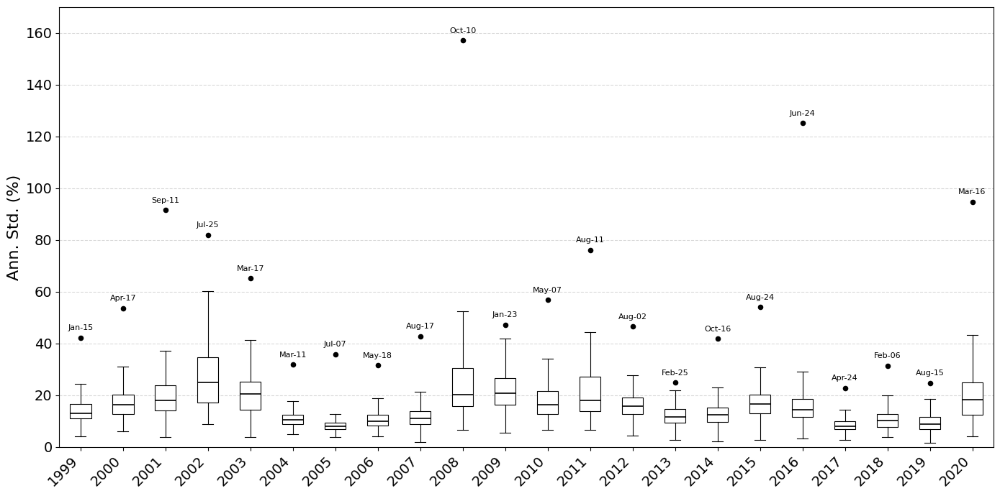

In [296]:

rv_ann = np.sqrt(MALL["RVD"] * 252) * 100
rv_ann_df = pd.DataFrame({
    "RVD_ann": rv_ann,
    "Year": MALL.index.year,
    "Date": MALL.index,
})

years = sorted(rv_ann_df["Year"].unique())
data_by_year = [rv_ann_df[rv_ann_df["Year"] == y]["RVD_ann"].values for y in years]

yearly_max_idx = rv_ann_df.groupby("Year")["RVD_ann"].idxmax()
yearly_max_val = rv_ann_df.loc[yearly_max_idx, "RVD_ann"]
yearly_max_date = rv_ann_df.loc[yearly_max_idx, "Date"]

fig, ax = plt.subplots(figsize=(14, 7))
ax.boxplot(
    data_by_year,
    positions=range(len(years)),
    patch_artist=True,
    showfliers=False,
    boxprops=dict(facecolor="white", color="black", linewidth=0.8),
    medianprops=dict(color="black", linewidth=1.2),
    whiskerprops=dict(color="black", linewidth=0.8),
    capprops=dict(color="black", linewidth=0.8),
)

y_range = rv_ann_df["RVD_ann"].max() - rv_ann_df["RVD_ann"].min()
fixed_offset = y_range * 0.015

for i, year in enumerate(years):
    max_val = yearly_max_val[yearly_max_val.index == yearly_max_idx[year]].values[0]
    max_date = yearly_max_date[yearly_max_date.index == yearly_max_idx[year]].values[0]
    max_date_str = pd.Timestamp(max_date).strftime("%b-%d")
    ax.scatter(i, max_val, color="black", s=20, zorder=5, marker="o")
    ax.text(i, max_val + fixed_offset, max_date_str, fontsize=8, ha="center", va="bottom", color="black")

ax.set_ylim(0, 170)
ax.set_xticks(range(len(years)))
ax.set_xticklabels(years, rotation=45, ha="right", fontsize=14)
ax.set_ylabel("Ann. Std. (%)", fontsize=16)
plt.yticks(fontsize=14)
ax.grid(True, linestyle="--", alpha=0.3, color="gray", axis="y")
ax.set_axisbelow(True)
ax.set_facecolor("white")

plt.tight_layout()
plt.savefig(os.path.join(figure_dir, "RV_box_plot_5min.pdf"), format="pdf", bbox_inches="tight")
plt.show()


In [297]:
MALL.columns

Index(['RVD', 'RVW', 'RVM', 'logRVD', 'logRVW', 'logRVM', 'RVD_pos', 'RVD_neg',
       'RD_neg', 'RW_neg', 'RM_neg', 'RQ', 'VSTOXX', 'logVSTOXX', 'EPU',
       'logEPU', 'EPU_1m_lag', 'logEPU_1m_lag', 'EURUSD', 'EURUSD_ret', 'CISS',
       'BRENT', 'BRENT_ret', 'NIKKEI_ret', 'NIKKEI_sq', 'SP500_ret_lag',
       'SP500_sq_lag', 'M1W', 'M1M', 'EURIBOR_3M', 'EURIBOR_3M_diff',
       'EURO_10Y_SWAP', 'EURO_10Y_SWAP_diff', 'EURO_3M_OVERNIGHT_INDEX',
       'EURO_3M_OVERNIGHT_INDEX_diff', 'EURIBOR_OIS_CS', 'TERM_CS',
       'RV_target', 'logRV_target'],
      dtype='object')

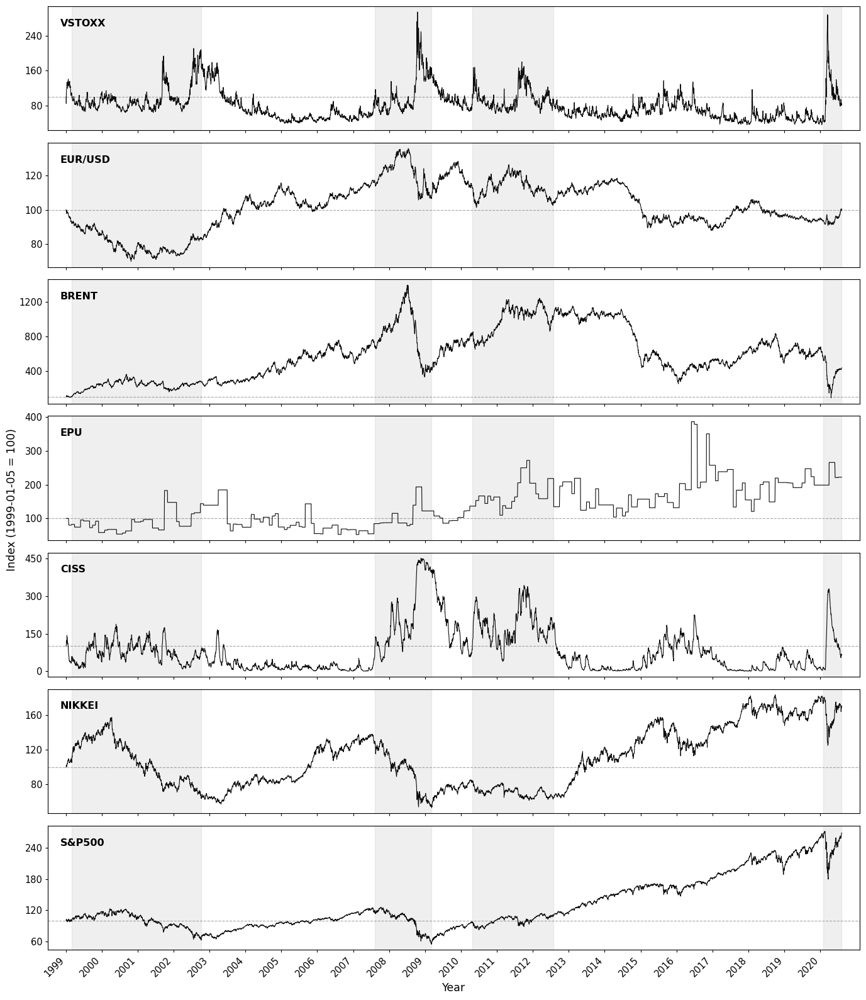

In [299]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Macro-financial and global equity panels indexed to 100 at the start of the sample
macro_panel = pd.DataFrame({
    "VSTOXX": MALL["VSTOXX"],
    "EURUSD": MALL["EURUSD"],
    "BRENT": MALL["BRENT"],
    "EPU": MALL["EPU"],
    "CISS": MALL["CISS"],
    "NIKKEI": NIKKEI["NIKKEI225"].reindex(MALL.index).ffill(),
    "SP500": SP500["Close"].reindex(MALL.index).ffill(),
})

macro_panel.index = pd.to_datetime(macro_panel.index)
macro_panel = macro_panel.sort_index().dropna()
df_indexed = macro_panel.div(macro_panel.iloc[0]).mul(100)

crisis_periods = [
    ("1999-03-01", "2002-10-09"),
    ("2007-08-09", "2009-03-09"),
    ("2010-04-27", "2012-07-26"),
    ("2020-02-01", "2020-08-07"),
]

series_names = ["VSTOXX", "EURUSD", "BRENT", "EPU", "CISS", "NIKKEI", "SP500"]
panel_labels = ["VSTOXX", "EUR/USD", "BRENT", "EPU", "CISS", "NIKKEI", "S&P500"]

start_data = df_indexed.index.min()
end_data = df_indexed.index.max()
padding = pd.DateOffset(months=6)

fig, axes = plt.subplots(
    7, 1,
    figsize=(14, 16),
    sharex=True
)

for ax, col, label in zip(axes, series_names, panel_labels):
    ax.plot(
        df_indexed.index,
        df_indexed[col],
        color="black",
        linewidth=0.8,
        alpha=0.95,
        zorder=3
    )

    ax.axhline(
        100,
        color="gray",
        linestyle="--",
        linewidth=0.8,
        alpha=0.7,
        zorder=1
    )

    for start, end in crisis_periods:
        ax.axvspan(
            pd.Timestamp(start),
            pd.Timestamp(end),
            color="gray",
            alpha=0.12,
            zorder=0
        )

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.8)
        spine.set_color("black")

    ax.text(
        0.015, 0.90, label,
        transform=ax.transAxes,
        fontsize=11.5,
        fontweight="bold",
        ha="left",
        va="top"
    )

    ax.tick_params(axis="y", labelsize=10.5, length=3, width=0.8)
    ax.tick_params(axis="x", labelsize=10.5, length=3, width=0.8)
    ax.yaxis.set_major_locator(plt.MaxNLocator(4))
    ax.grid(False)
    ax.set_xlim(start_data - padding, end_data + padding)

axes[-1].xaxis.set_major_locator(mdates.YearLocator(1))
axes[-1].xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
axes[-1].set_xticks(pd.date_range("1999-01-01", "2020-01-01", freq="YS"))

plt.setp(
    axes[-1].get_xticklabels(),
    rotation=45,
    ha="right",
    fontsize=10.5
)

for ax in axes[:-1]:
    ax.tick_params(axis="x", labelbottom=False)

fig.supylabel("Index (1999-01-05 = 100)", fontsize=12.5, x=0.02)
axes[-1].set_xlabel("Year", fontsize=12.5)

plt.tight_layout()
fig.subplots_adjust(hspace=0.10)

plt.savefig(
    os.path.join(figure_dir, "MacroPanel.pdf"),
    format="pdf",
    bbox_inches="tight"
)

plt.show()

## 2.0 Save MALL_extended_5min.csv


In [308]:

# Save the completed 5-minute MALL extended dataset
folder_path = "/Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Cleaned Data Sets"
os.makedirs(folder_path, exist_ok=True)
file_path = os.path.join(folder_path, "MALL_extended_5min.csv")
MALL.to_csv(file_path, index=True)
print(f"\nFile saved successfully at: {file_path}")



File saved successfully at: /Users/tobiasbergdahlpersson/Documents/SSE/MSc Thesis/5-min RV/Cleaned Data Sets/MALL_extended_5min.csv


## 3.0 Summary Statistics for Final Variables

These are the variables covered in the **Summary Statistics** table

In [312]:
# Summary statistics table for final MALL extended predictors
summary_cols = [
    "RVD", "RVW", "RVM",
    "RVD_pos", "RVD_neg",
    "RD_neg", "RW_neg", "RM_neg",
    "RQ",
    "VSTOXX", "CISS", "logEPU_1m_lag",
    "EURUSD_ret", "BRENT_ret",
    "NIKKEI_ret", "NIKKEI_sq",
    "SP500_ret_lag", "SP500_sq_lag",
    "M1W", "M1M",
    "EURIBOR_3M", "EURIBOR_3M_diff", "EURO_10Y_SWAP", "EURO_10Y_SWAP_diff", "EURO_3M_OVERNIGHT_INDEX", "EURO_3M_OVERNIGHT_INDEX_diff",
    "EURIBOR_OIS_CS", "TERM_CS"
]

MALL_display = pd.DataFrame({
    "RVD": np.sqrt(MALL["RVD"] * 252) * 100,
    "RVW": np.sqrt(MALL["RVW"] * 252) * 100,
    "RVM": np.sqrt(MALL["RVM"] * 252) * 100,
    "RVD_pos": np.sqrt(MALL["RVD_pos"] * 252) * 100,
    "RVD_neg": np.sqrt(MALL["RVD_neg"] * 252) * 100,
    "RD_neg": MALL["RD_neg"] * 100,
    "RW_neg": MALL["RW_neg"] * 100,
    "RM_neg": MALL["RM_neg"] * 100,
    "RQ": MALL["RQ"] * 1e6,
    "VSTOXX": MALL["VSTOXX"],
    "CISS": MALL["CISS"],
    "logEPU_1m_lag": MALL["logEPU_1m_lag"],
    "EURUSD_ret": MALL["EURUSD_ret"] * 100,
    "BRENT_ret": MALL["BRENT_ret"] * 100,
    "NIKKEI_ret": MALL["NIKKEI_ret"] * 100,
    "NIKKEI_sq": MALL["NIKKEI_sq"] * 1e4,
    "SP500_ret_lag": MALL["SP500_ret_lag"] * 100,
    "SP500_sq_lag": MALL["SP500_sq_lag"] * 1e4,
    "M1W": MALL["M1W"] * 100,
    "M1M": MALL["M1M"] * 100,
    "EURIBOR_3M": MALL["EURIBOR_3M"],
    "EURIBOR_3M_diff": MALL["EURIBOR_3M_diff"],
    "EURO_10Y_SWAP": MALL["EURO_10Y_SWAP"],
    "EURO_10Y_SWAP_diff": MALL["EURO_10Y_SWAP_diff"],
    "EURO_3M_OVERNIGHT_INDEX": MALL["EURO_3M_OVERNIGHT_INDEX"],
    "EURO_3M_OVERNIGHT_INDEX_diff": MALL["EURO_3M_OVERNIGHT_INDEX_diff"],
    "EURIBOR_OIS_CS": MALL["EURIBOR_OIS_CS"],
    "TERM_CS": MALL["TERM_CS"],
})

summary_table = pd.DataFrame({
    "Obs.": MALL_display[summary_cols].count(),
    "Mean": MALL_display[summary_cols].mean(),
    "Median": MALL_display[summary_cols].median(),
    "Std. Dev.": MALL_display[summary_cols].std(),
    "Skewness": MALL_display[summary_cols].skew(),
    "Exc. Kurt.": MALL_display[summary_cols].kurt(),
    "Min": MALL_display[summary_cols].min(),
    "Max": MALL_display[summary_cols].max(),
}).round(2)

styled_summary = (
    summary_table.style
    .set_caption(
        "Table: Summary Statistics of Final MALL Extended Predictors -- EURO STOXX 50 "
        f"({MALL.index[0].strftime('%Y-%m-%d')} to {MALL.index[-1].strftime('%Y-%m-%d')}). "
        "RVD, RVW, RVM, RVD_pos, and RVD_neg are shown as annualized std (%). "
        "RD_neg, RW_neg, RM_neg, EURUSD_ret, BRENT_ret, NIKKEI_ret, SP500_ret_lag, M1W, and M1M are shown as %. "
        "RQ is scaled by 10^6, while NIKKEI_sq and SP500_sq_lag are scaled by 10^4. "
        "The three added euro-area rate variables, their signed daily changes, and the two constructed spread variables are shown in their original units."
    )
    .format(lambda x: f"{x:,.2f}")
    .format(lambda x: f"{int(x):,}", subset=pd.IndexSlice[:, "Obs."])
    .set_table_styles([
        {"selector": "caption", "props": [("font-size", "12px"), ("font-weight", "bold"), ("text-align", "left"), ("padding-bottom", "8px"), ("color", "black"), ("caption-side", "top")]},
        {"selector": "thead tr th", "props": [("background-color", "white"), ("color", "black"), ("font-size", "11px"), ("text-align", "center"), ("padding", "6px 10px"), ("border-top", "2px solid black"), ("border-bottom", "1px solid black"), ("font-weight", "bold")]},
        {"selector": "tbody tr th", "props": [("font-size", "11px"), ("font-weight", "bold"), ("text-align", "left"), ("padding", "4px 10px"), ("color", "black"), ("background-color", "white"), ("border-right", "1px solid black")]},
        {"selector": "tbody tr td", "props": [("font-size", "11px"), ("text-align", "right"), ("padding", "4px 10px"), ("background-color", "white"), ("color", "black")]},
        {"selector": "tbody tr:last-child td, tbody tr:last-child th", "props": [("border-bottom", "2px solid black")]},
        {"selector": "table", "props": [("border-collapse", "collapse"), ("width", "100%"), ("border-top", "2px solid black"), ("border-bottom", "2px solid black")]},
        {"selector": "td, th", "props": [("border-left", "none"), ("border-right", "none")]},
    ])
)

display(styled_summary)


,Obs.,Mean,Median,Std. Dev.,Skewness,Exc. Kurt.,Min,Max
RVD,"5,489",16.14,13.76,9.96,3.17,20.33,0.15,157.11
RVW,"5,489",16.51,14.18,9.33,2.62,11.04,4.52,93.58
RVM,"5,489",16.83,14.40,8.75,2.15,6.46,5.29,71.78
RVD_pos,"5,489",11.22,9.54,6.79,2.77,13.51,0.09,83.33
RVD_neg,"5,489",11.37,9.50,7.66,3.80,32.94,0.12,138.64
RD_neg,"5,489",-0.44,0.00,0.80,-3.37,18.27,-10.54,0.00
RW_neg,"5,489",-0.21,0.00,0.38,-3.83,25.44,-5.41,0.00
RM_neg,"5,489",-0.10,0.00,0.19,-3.51,17.55,-1.91,0.00
RQ,"5,489",0.65,0.01,19.50,50.39,"2,681.48",0.00,"1,129.75"
VSTOXX,"5,489",23.91,21.98,9.78,1.71,4.18,10.68,87.51



## 4.0 Spread Variables Over Time
To conclude the construction notebook, we plot the two constructed spread variables separately so their time-series behaviour can be inspected directly before they are used in downstream modeling work.


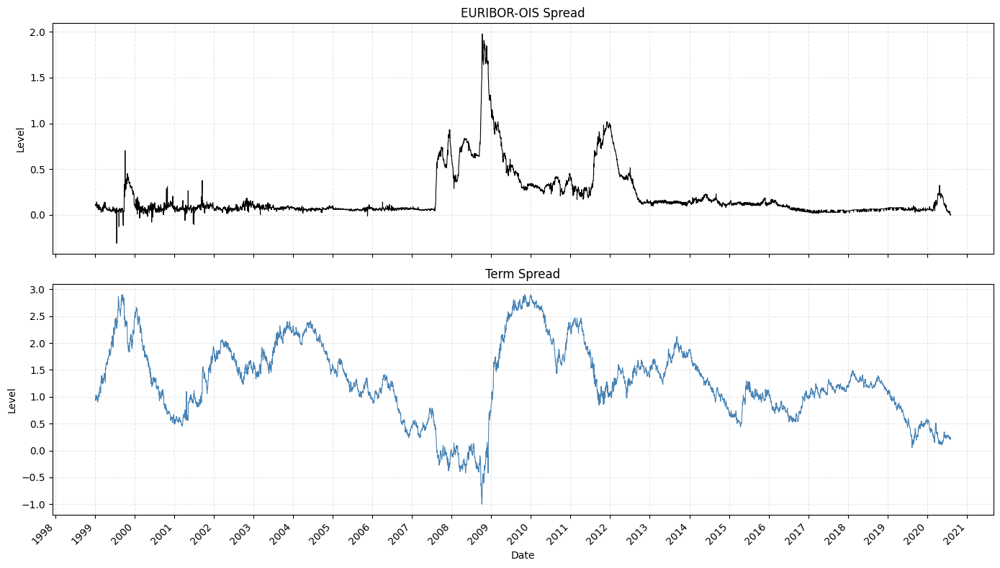

In [315]:

fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

series_info = [
    ("EURIBOR_OIS_CS", "EURIBOR-OIS Spread", "black"),
    ("TERM_CS", "Term Spread", "steelblue"),
]

for ax, (col, title, color) in zip(axes, series_info):
    ax.plot(MALL.index, MALL[col], color=color, linewidth=0.8)
    ax.set_title(title, fontsize=12)
    ax.set_ylabel("Level")
    ax.grid(True, linestyle="--", alpha=0.3)

axes[-1].set_xlabel("Date")
axes[-1].xaxis.set_major_locator(mdates.YearLocator(1))
axes[-1].xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.setp(axes[-1].get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()
